<center><h1>WGAN Model</h1></center>

#### Model Summary

##### 1. Base Model

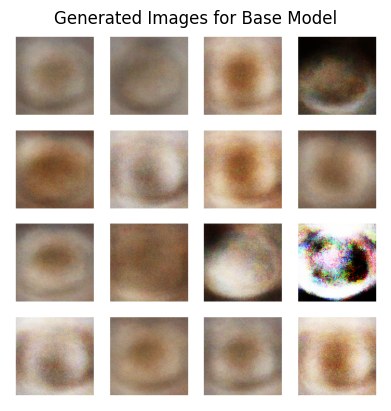

In [41]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

image_path = "./Generated_Images/BaseModel.png"

img = mpimg.imread(image_path)
plt.imshow(img)
plt.title('Generated Images for Base Model')
plt.axis('off')  
plt.show()


##### 2. Model Tuning 1

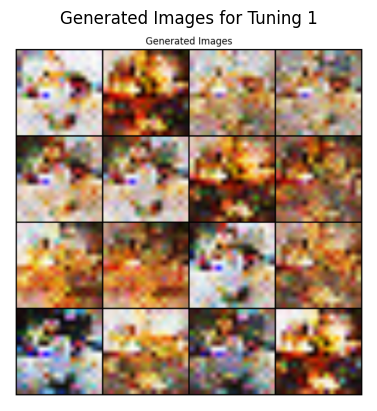

In [102]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

image_path = "./Generated_Images/Tuning1.png"

img = mpimg.imread(image_path)
plt.imshow(img)
plt.title('Generated Images for Tuning 1')
plt.axis('off')  
plt.show()


#### 3. Model Tuning 2

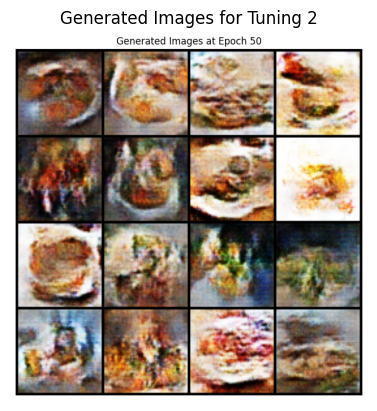

In [141]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

image_path = "./Generated_Images/Tuning2.png"

img = mpimg.imread(image_path)
plt.imshow(img)
plt.title('Generated Images for Tuning 2')
plt.axis('off')  
plt.show()


#### 4. Model Tuning 3

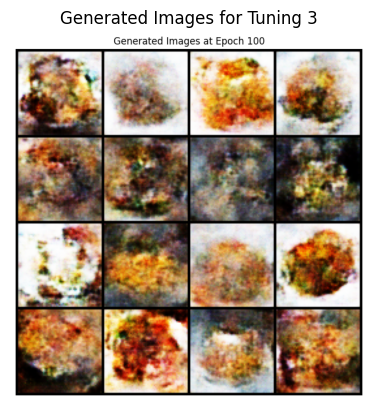

In [142]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

image_path = "./Generated_Images/Tuning3.png"

img = mpimg.imread(image_path)
plt.imshow(img)
plt.title('Generated Images for Tuning 3')
plt.axis('off')  
plt.show()


#### Evaluation Metrics

In [144]:
# File path
file_path = "metrics.txt"

# Read the file line by line
with open(file_path, "r") as file:
    lines = file.readlines()
print()
# Print the content
for line in lines:
    print(line.strip())  # Remove any leading/trailing whitespace



FID Score Base Model: 369.6523
Inception Score Base Model: 2.1254 ± 0.0471
FID Score for Tuning 1: 440.4061
Inception Score for Tuning 1: 1.4904 ± 0.0400
FID Score for Tuning 2: 167.5063
Inception Score for Tuning 2: 1.9839 ± 0.0896
FID Score for Tuning 3: 197.6044
Inception Score for Tuning 3: 1.6335 ± 0.0524


## MECE
| Name               | Task Done      |
|-----------------------|----------------------------|
| Arshia | Model Building and Evaluation of Base model and Tuning 1 of WGAN |
| Baldeep | Model Building and Evaluation of Tuning 2 and Tuning 3 of WGAN |
| Shubham | Deployment |
| Sameer | Deployment |
| Aman | DCGAN | 
| Ramandeep | DCGAN | 
| Abhishek | VAE | 
| Ram Krishna | VAE |
| Palash | cGAN |
| Govind | cGAN |


#### Importing Libraries

In [65]:
import pandas as pd
import os
import json
import numpy as np
import matplotlib.pyplot as plt
import torch
import torchvision.utils as vutils
from torch.utils.data import Dataset, DataLoader, Subset
from torchvision import transforms, datasets
import random
from PIL import Image
import torch.nn as nn
import torch.optim as optim
import torch
from torchvision.models import inception_v3
from torcheval.metrics import FrechetInceptionDistance
from torchvision.transforms import functional as F

In [32]:
# !pip install torcheval

In [2]:
print(f"CUDA Available: {torch.cuda.is_available()}")
print(f"CUDA Version: {torch.version.cuda}")
print(f"GPU Name: {torch.cuda.get_device_name(0)}")

CUDA Available: True
CUDA Version: 12.1
GPU Name: NVIDIA GeForce RTX 4060 Laptop GPU


In [ ]:
photos_df = pd.read_json(r'yelp_photos\photos.json', lines=True)

In [4]:
photos_df.head()

,photo_id,business_id,caption,label
0,zsvj7vloL4L5jhYyPIuVwg,Nk-SJhPlDBkAZvfsADtccA,Nice rock artwork everywhere and craploads of ...,inside
1,HCUdRJHHm_e0OCTlZetGLg,yVZtL5MmrpiivyCIrVkGgA,,outside
2,vkr8T0scuJmGVvN2HJelEA,_ab50qdWOk0DdB6XOrBitw,oyster shooter,drink
3,pve7D6NUrafHW3EAORubyw,SZU9c8V2GuREDN5KgyHFJw,Shrimp scampi,food
4,H52Er-uBg6rNrHcReWTD2w,Gzur0f0XMkrVxIwYJvOt2g,,food


In [5]:
photos_df['label'].unique()

array(['inside', 'outside', 'drink', 'food', 'menu'], dtype=object)

In [6]:
count_type = []
for i in photos_df['label'].unique():
    count_type.append(photos_df['label'].tolist().count(i))
    print(f"{i} class - {photos_df['label'].tolist().count(i)} images")

inside class - 56031 images
outside class - 18569 images
drink class - 15670 images
food class - 108152 images
menu class - 1678 images


<BarContainer object of 5 artists>

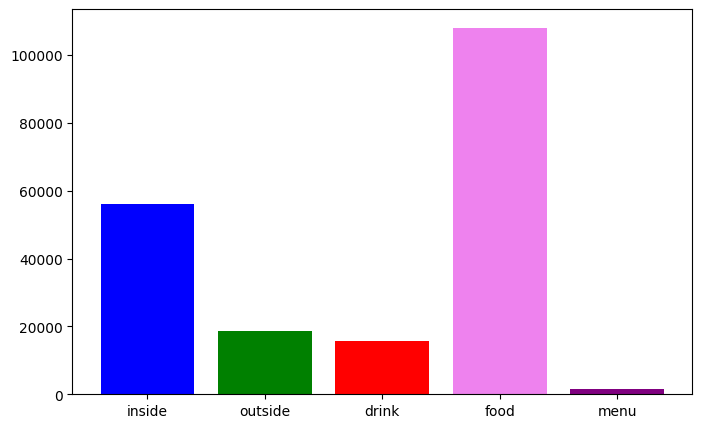

In [7]:
plt.figure(figsize=(8, 5))
plt.bar(photos_df['label'].unique(), count_type, color=['blue', 'green', 'red', 'violet', 'purple'])

In [8]:
# Dataset Class
class YelpDataset(Dataset):
    def __init__(self, image_folder, json_file, label_filter, transform=None):
        self.image_folder = image_folder
        self.transform = transform
        self.label_filter = label_filter
        self.image_files = []

        with open(json_file, 'r') as f:
            for line in f:
                try:
                    entry = json.loads(line.strip())
                    if entry.get('label') == self.label_filter:
                        image_filename = entry['photo_id'] + '.jpg'
                        image_path = os.path.join(image_folder, image_filename)
                        if os.path.isfile(image_path):
                            try:
                                with Image.open(image_path) as img:
                                    img.verify()
                                self.image_files.append(image_filename)
                            except Exception as e:
                                print(f"Skipping corrupted image {image_filename}: {str(e)}")
                except json.JSONDecodeError as e:
                    print(f"Error decoding JSON line: {line.strip()} -> {str(e)}")

        print(f"Found {len(self.image_files)} valid images with label '{self.label_filter}'")
        
    def __len__(self):
        return len(self.image_files)
    
    def __getitem__(self, idx):
        while True:
            try:
                img_path = os.path.join(self.image_folder, self.image_files[idx])
                image = Image.open(img_path).convert('RGB')
                if self.transform:
                    image = self.transform(image)
                return image
            except Exception as e:
                print(f"Error loading image {self.image_files[idx]}: {str(e)}")
                idx = (idx + 1) % len(self.image_files)

In [ ]:
photos = r'yelp_photos\photos'
metadata = r'yelp_photos\photos.json'
label_filter = "food"

In [10]:
transform = transforms.Compose([
    transforms.Resize((128, 128)),
    transforms.ToTensor(),
    transforms.Normalize([0.5], [0.5])  # Normalize to [-1, 1]
])

In [ ]:
dataset = YelpDataset(image_folder=photos, json_file=metadata, label_filter=label_filter, transform=transform)

## Base Model

In [14]:
subset_indices = random.sample(range(len(dataset)), min(7000, len(dataset))) 
subset = Subset(dataset, subset_indices)
dataloader = DataLoader(subset, batch_size=64, shuffle=True)

In [16]:
# Generator Model
class Generator(nn.Module):
    def __init__(self, latent_dim):
        super(Generator, self).__init__()
        self.model = nn.Sequential(
            nn.Linear(latent_dim, 256),
            nn.LeakyReLU(0.2),
            nn.Linear(256, 512),
            nn.BatchNorm1d(512),
            nn.LeakyReLU(0.2),
            nn.Linear(512, 1024),
            nn.BatchNorm1d(1024),
            nn.LeakyReLU(0.2),
            nn.Linear(1024, 128 * 128 * 3),  # Output size for 128x128x3 image
            nn.Tanh()
        )

    def forward(self, z):
        img = self.model(z)
        img = img.view(img.size(0), 3, 128, 128)  # Reshape to 128x128x3
        return img

In [17]:
# Discriminator Model
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.model = nn.Sequential(
            nn.Linear(128 * 128 * 3, 1024),
            nn.LeakyReLU(0.2),
            nn.Linear(1024, 512),
            nn.LeakyReLU(0.2),
            nn.Linear(512, 1)
        )

    def forward(self, img):
        img_flat = img.view(img.size(0), -1)  # Flatten 128x128x3 images
        validity = self.model(img_flat)
        return validity

In [18]:
latent_dim = 100
generator_base = Generator(latent_dim).cuda()
discriminator_base = Discriminator().cuda()

In [20]:
optimizer_G = optim.RMSprop(generator_base.parameters(), lr=0.0002)
optimizer_D = optim.RMSprop(discriminator_base.parameters(), lr=0.0002)

In [21]:
# Training Loop
n_epochs = 50
n_critic = 5

In [23]:
for epoch in range(n_epochs):
    for i, imgs in enumerate(dataloader):
        real_imgs = imgs.cuda()

        # Train Discriminator
        optimizer_D.zero_grad()
        z = torch.randn(imgs.size(0), latent_dim).cuda()
        fake_imgs = generator_base(z).detach()
        loss_D = -torch.mean(discriminator_base(real_imgs)) + torch.mean(discriminator_base(fake_imgs))
        loss_D.backward()
        optimizer_D.step()

        # Clip discriminator weights
        for p in discriminator_base.parameters():
            p.data.clamp_(-0.01, 0.01)

        # Train Generator every n_critic steps
        if i % n_critic == 0:
            optimizer_G.zero_grad()
            gen_imgs = generator_base(z)
            loss_G = -torch.mean(discriminator_base(gen_imgs))
            loss_G.backward()
            optimizer_G.step()

    print(f"[Epoch {epoch + 1}/{n_epochs}] Loss_D: {loss_D.item():.4f} Loss_G: {loss_G.item():.4f}")


[Epoch 1/50] Loss_D: -477.4080 Loss_G: -34.0941
[Epoch 2/50] Loss_D: 5.7556 Loss_G: -22.5922
[Epoch 3/50] Loss_D: 13.2684 Loss_G: 751.8094
[Epoch 4/50] Loss_D: -168.6426 Loss_G: 600.5760
[Epoch 5/50] Loss_D: -43.3712 Loss_G: -271.5732
[Epoch 6/50] Loss_D: -111.4825 Loss_G: 60.4431
[Epoch 7/50] Loss_D: -85.2946 Loss_G: -19.3190
[Epoch 8/50] Loss_D: 16.2351 Loss_G: -9.0795
[Epoch 9/50] Loss_D: -186.2119 Loss_G: 9.2792
[Epoch 10/50] Loss_D: -288.0344 Loss_G: -39.6688
[Epoch 11/50] Loss_D: -54.9304 Loss_G: -169.4471
[Epoch 12/50] Loss_D: -63.5950 Loss_G: 4.9419
[Epoch 13/50] Loss_D: -127.1321 Loss_G: -23.5435
[Epoch 14/50] Loss_D: -141.1325 Loss_G: 124.8398
[Epoch 15/50] Loss_D: -150.9208 Loss_G: 129.3078
[Epoch 16/50] Loss_D: -122.1177 Loss_G: 78.3114
[Epoch 17/50] Loss_D: -154.2849 Loss_G: 121.1209
[Epoch 18/50] Loss_D: -109.7233 Loss_G: -5.3295
[Epoch 19/50] Loss_D: -164.2349 Loss_G: 62.6661
[Epoch 20/50] Loss_D: -108.1168 Loss_G: 47.1091
[Epoch 21/50] Loss_D: -106.2515 Loss_G: -5.4526


In [24]:
# Visualize Generated Images
def show_generated_images(generator, latent_dim, n_images=16):
    generator.eval()
    z = torch.randn(n_images, latent_dim).cuda()
    gen_imgs = generator(z).detach().cpu().numpy()
    gen_imgs = 0.5 * gen_imgs + 0.5  # Rescale to [0, 1]
    
    fig, axs = plt.subplots(4, 4, figsize=(8, 8))
    cnt = 0
    for i in range(4):
        for j in range(4):
            axs[i, j].imshow(np.transpose(gen_imgs[cnt], (1, 2, 0)))
            axs[i, j].axis('off')
            cnt += 1
    plt.show()

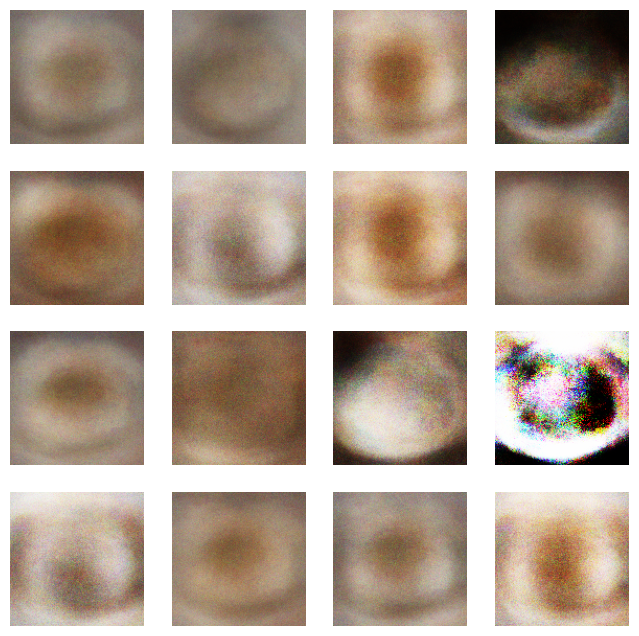

In [26]:
# Display generated images
show_generated_images(generator_base, latent_dim)

In [30]:
torch.save(generator_base.state_dict(), "saved_models/generator_base_epoch_50.pth")
torch.save(discriminator_base.state_dict(), "saved_models/discriminator_base_epoch_50.pth")


### Base Model - Evaluation

In [34]:
# Initialize the FID metric
fid_metric = FrechetInceptionDistance()

# Function to resize and normalize images to [0, 1] for FID
def preprocess_for_fid(images):
    images_resized = torch.stack([F.resize(img, (299, 299)) for img in images])
    return images_resized.clamp(0, 1)  # Ensure values are in the [0, 1] range

# Function to compute FID
def compute_fid(generator, dataloader, latent_dim, device, num_samples=5000, batch_size=64):
    generator.eval()
    fid_metric.to(device)

    # Add real images to FID metric
    for real_imgs in dataloader:
        real_imgs = real_imgs.to(device)
        real_imgs_resized = preprocess_for_fid(real_imgs)
        fid_metric.update(real_imgs_resized, is_real=True)

    # Generate fake images and add to FID metric
    with torch.no_grad():
        for _ in range(num_samples // batch_size):
            z = torch.randn(batch_size, latent_dim, device=device)
            gen_imgs = generator(z)
            gen_imgs = (gen_imgs + 1) / 2  # Rescale [-1, 1] to [0, 1]
            gen_imgs_resized = preprocess_for_fid(gen_imgs)
            fid_metric.update(gen_imgs_resized, is_real=False)

    fid_score = fid_metric.compute()
    fid_metric.reset()
    generator.train()

    return fid_score.item()

Downloading: "https://download.pytorch.org/models/inception_v3_google-0cc3c7bd.pth" to C:\Users\arshi/.cache\torch\hub\checkpoints\inception_v3_google-0cc3c7bd.pth
100%|██████████| 104M/104M [00:17<00:00, 6.27MB/s] 


In [36]:
# Evaluate FID
latent_dim = 100  # Ensure this matches your generator's latent dimension
num_samples = 1000  # Number of images to evaluate
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

print("Calculating Fréchet Inception Distance...")
fid_score = compute_fid(generator_base, dataloader, latent_dim, device, num_samples=num_samples)
print(f"FID Score: {fid_score:.4f}")

Calculating Fréchet Inception Distance...
FID Score: 363.5993


In [43]:
import torch
from torch.nn.functional import softmax
from torchvision.models import inception_v3
from torchvision.transforms import functional as F
from torch.utils.data import DataLoader
from tqdm import tqdm

# Function to preprocess images for InceptionV3
def preprocess_for_inception(images):
    images_resized = torch.stack([F.resize(img, (299, 299)) for img in images])
    images_normalized = (images_resized - 0.5) / 0.5  # Normalize to [-1, 1]
    return images_normalized

# Function to compute Inception Score
def compute_inception_score(generator, latent_dim, device, num_samples=5000, batch_size=64, splits=10):
    generator.eval()
    inception_model = inception_v3(pretrained=True, transform_input=False).to(device)
    inception_model.eval()

    preds = []
    with torch.no_grad():
        for _ in tqdm(range(num_samples // batch_size), desc="Generating Images for IS"):
            # Generate fake images
            z = torch.randn(batch_size, latent_dim, device=device)
            gen_imgs = generator(z)
            gen_imgs = (gen_imgs + 1) / 2  # Rescale [-1, 1] to [0, 1]

            # Preprocess images for InceptionV3
            gen_imgs_preprocessed = preprocess_for_inception(gen_imgs).to(device)

            # Get predictions from InceptionV3
            logits = inception_model(gen_imgs_preprocessed)
            preds.append(softmax(logits, dim=1).cpu().numpy())

    preds = np.concatenate(preds, axis=0)

    # Compute IS
    split_scores = []
    for i in range(splits):
        part = preds[i * (num_samples // splits): (i + 1) * (num_samples // splits), :]
        py = np.mean(part, axis=0)
        scores = part * (np.log(part) - np.log(py))
        split_scores.append(np.exp(np.mean(np.sum(scores, axis=1))))

    inception_score = np.mean(split_scores)
    std = np.std(split_scores)

    generator.train()
    return inception_score, std

# Evaluate Inception Score
latent_dim = 100  # Ensure this matches your generator's latent dimension
num_samples = 1000  # Number of images to evaluate
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

print("Calculating Inception Score...")
inception_score, inception_std = compute_inception_score(generator_base, latent_dim, device, num_samples=num_samples)
print(f"Inception Score: {inception_score:.4f} ± {inception_std:.4f}")


Calculating Inception Score...


c:\Users\arshi\anaconda3\envs\yelp_image_models\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\arshi\anaconda3\envs\yelp_image_models\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=Inception_V3_Weights.IMAGENET1K_V1`. You can also use `weights=Inception_V3_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Generating Images for IS: 100%|██████████| 15/15 [00:03<00:00,  4.70it/s]

Inception Score: 2.1714 ± 0.1642


In [85]:
# Save FID and IS results
fid_score = compute_fid(generator_base, dataloader, latent_dim, device, num_samples=num_samples)
print(f"FID Score: {fid_score:.4f}")
with open("metrics.txt", "a") as f:
    f.write(f"FID Score Base Model: {fid_score:.4f}\n")

inception_score, inception_std = compute_inception_score(generator_base, latent_dim, device, num_samples=num_samples)
print(f"Inception Score: {inception_score:.4f} ± {inception_std:.4f}")
with open("metrics.txt", "a") as f:
    f.write(f"Inception Score Base Model: {inception_score:.4f} ± {inception_std:.4f}\n")


FID Score: 369.6523


c:\Users\arshi\anaconda3\envs\yelp_image_models\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\arshi\anaconda3\envs\yelp_image_models\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=Inception_V3_Weights.IMAGENET1K_V1`. You can also use `weights=Inception_V3_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Generating Images for IS: 100%|██████████| 15/15 [00:02<00:00,  6.11it/s]

Inception Score: 2.1254 ± 0.0471


## Tuning 1

1. Adding Gradient penalty
2. Learning rate scheduler
3. Adding convolutional layers in generator and discriminator
4. Added batch normalization in disciminator

In [86]:
import torch.nn.functional as F

class Generator(nn.Module):
    def __init__(self, latent_dim):
        super(Generator, self).__init__()
        
        self.model = nn.Sequential(
            
            nn.ConvTranspose2d(latent_dim, 256, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),
            
            nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
            
            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            
            nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1),
            nn.Tanh()
        )
        
    def forward(self, z):
        """
        Forward pass of the generator.
        z: Latent vector of shape (batch_size, latent_dim, 1, 1)
        """
        z = z.view(z.size(0), z.size(1), 1, 1)

        img = self.model(z)
        img = F.interpolate(img, size=(128, 128), mode='bilinear', align_corners=False)  # Resize to match real image size
        return img


In [87]:
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        
        self.model = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            
            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),
            
            nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),
            
            nn.Conv2d(256, 1, kernel_size=4, stride=1, padding=0),
        )
    
    def forward(self, img):
        """
        Forward pass of the discriminator.
        img: Input image of shape (batch_size, 3, 128, 128)
        """
        validity = self.model(img)
        return validity.view(-1)  # Flatten for scalar output


In [88]:
# Instantiate the models
latent_dim = 100  # Dimension of the noise vector (latent space)
generator1 = Generator(latent_dim).to(device)
discriminator1 = Discriminator().to(device)


In [89]:
def compute_gradient_penalty(discriminator, real_samples, fake_samples, device):
    """
    Computes the gradient penalty for WGAN-GP.
    """
    # Ensure sizes match
    if real_samples.size() != fake_samples.size():
        fake_samples = F.interpolate(fake_samples, size=real_samples.shape[2:], mode='bilinear', align_corners=False)

    alpha = torch.rand(real_samples.size(0), 1, 1, 1, device=device)
    interpolates = (alpha * real_samples + (1 - alpha) * fake_samples).requires_grad_(True)
    
    d_interpolates = discriminator(interpolates)
    gradients = torch.autograd.grad(
        outputs=d_interpolates,
        inputs=interpolates,
        grad_outputs=torch.ones_like(d_interpolates, device=device),
        create_graph=True,
        retain_graph=True,
        only_inputs=True
    )[0]
    
    gradients = gradients.view(gradients.size(0), -1)
    gradient_penalty = ((gradients.norm(2, dim=1) - 1) ** 2).mean()
    return gradient_penalty


In [90]:
def discriminator_loss(discriminator, real_images, fake_images, lambda_gp, device):
    """
    Calculates the discriminator loss with gradient penalty.
    """
    real_validity = discriminator(real_images)
    fake_validity = discriminator(fake_images.detach())
    gradient_penalty = compute_gradient_penalty(discriminator, real_images, fake_images, device)
    d_loss = -torch.mean(real_validity) + torch.mean(fake_validity) + lambda_gp * gradient_penalty
    return d_loss


In [91]:
def generator_loss(discriminator, fake_images):
    """
    Calculates the generator loss.
    """
    g_loss = -torch.mean(discriminator(fake_images))
    return g_loss


In [92]:
# Hyperparameters
latent_dim = 100
batch_size = 64
lr = 1e-4
beta1, beta2 = 0.0, 0.9
lambda_gp = 10
n_epochs = 75

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Instantiate models
generator1 = Generator(latent_dim).to(device)
discriminator1 = Discriminator().to(device)

# Optimizers
g_optimizer = torch.optim.Adam(generator1.parameters(), lr=lr, betas=(beta1, beta2))
d_optimizer = torch.optim.Adam(discriminator1.parameters(), lr=lr, betas=(beta1, beta2))

# Scheduler
scheduler_g = torch.optim.lr_scheduler.StepLR(g_optimizer, step_size=20, gamma=0.5)
scheduler_d = torch.optim.lr_scheduler.StepLR(d_optimizer, step_size=20, gamma=0.5)


In [93]:
from tqdm import tqdm

for epoch in range(n_epochs):
    for i, real_images in enumerate(dataloader):
        real_images = real_images.to(device)

        # Generate fake images
        z = torch.randn(real_images.size(0), latent_dim, 1, 1, device=device)
        fake_images = generator1(z)

        # Update Discriminator
        d_optimizer.zero_grad()
        loss_D = discriminator_loss(discriminator1, real_images, fake_images, lambda_gp, device)
        loss_D.backward()
        d_optimizer.step()

        # Update Generator
        if i % 5 == 0:  # Update generator less frequently
            g_optimizer.zero_grad()
            z = torch.randn(batch_size, latent_dim, 1, 1, device=device)
            fake_images = generator1(z)
            loss_G = generator_loss(discriminator1, fake_images)
            loss_G.backward()
            g_optimizer.step()
    
    # Step learning rate scheduler
    scheduler_g.step()
    scheduler_d.step()

    # Print losses
    print(f"[Epoch {epoch + 1}/{n_epochs}] Loss_D: {loss_D.item():.4f} Loss_G: {loss_G.item():.4f}")


[Epoch 1/75] Loss_D: 0.8211 Loss_G: -0.0420
[Epoch 2/75] Loss_D: -0.0406 Loss_G: -0.1133
[Epoch 3/75] Loss_D: -0.0467 Loss_G: -0.1537
[Epoch 4/75] Loss_D: 0.1333 Loss_G: -0.1396
[Epoch 5/75] Loss_D: -0.0522 Loss_G: -0.1139
[Epoch 6/75] Loss_D: -0.0706 Loss_G: -0.1086
[Epoch 7/75] Loss_D: -0.0844 Loss_G: -0.1356
[Epoch 8/75] Loss_D: -0.0479 Loss_G: -0.0291
[Epoch 9/75] Loss_D: -0.0253 Loss_G: 0.0084
[Epoch 10/75] Loss_D: -0.0394 Loss_G: -0.0344
[Epoch 11/75] Loss_D: -0.0474 Loss_G: -0.0769
[Epoch 12/75] Loss_D: -0.1006 Loss_G: -0.0623
[Epoch 13/75] Loss_D: -0.0844 Loss_G: 0.0469
[Epoch 14/75] Loss_D: -0.1000 Loss_G: 0.0035
[Epoch 15/75] Loss_D: -0.0875 Loss_G: -0.0732
[Epoch 16/75] Loss_D: -0.0978 Loss_G: -0.1801
[Epoch 17/75] Loss_D: -0.0889 Loss_G: -0.0800
[Epoch 18/75] Loss_D: -0.0359 Loss_G: -0.1142
[Epoch 19/75] Loss_D: 0.0014 Loss_G: -0.1520
[Epoch 20/75] Loss_D: -0.0870 Loss_G: -0.1445
[Epoch 21/75] Loss_D: -0.1086 Loss_G: -0.0905
[Epoch 22/75] Loss_D: -0.1204 Loss_G: -0.0337
[Ep

In [94]:
# Function to visualize generated images
def visualize_generated_images(generator, latent_dim, num_images, device):
    generator.eval()  # Set the generator to evaluation mode
    with torch.no_grad():
        # Generate random latent vectors
        z = torch.randn(num_images, latent_dim, 1, 1, device=device)
        # Generate fake images
        fake_images = generator(z)
        # Denormalize images if needed (assuming [-1, 1] range)
        fake_images = (fake_images + 1) / 2
        # Move images to CPU for visualization
        fake_images = fake_images.cpu()
    # Create a grid of images
    grid = vutils.make_grid(fake_images, nrow=int(num_images**0.5), padding=2, normalize=False)
    # Plot the grid
    plt.figure(figsize=(8, 8))
    plt.axis("off")
    plt.title("Generated Images")
    plt.imshow(grid.permute(1, 2, 0))  # Convert from CHW to HWC for plotting
    plt.show()

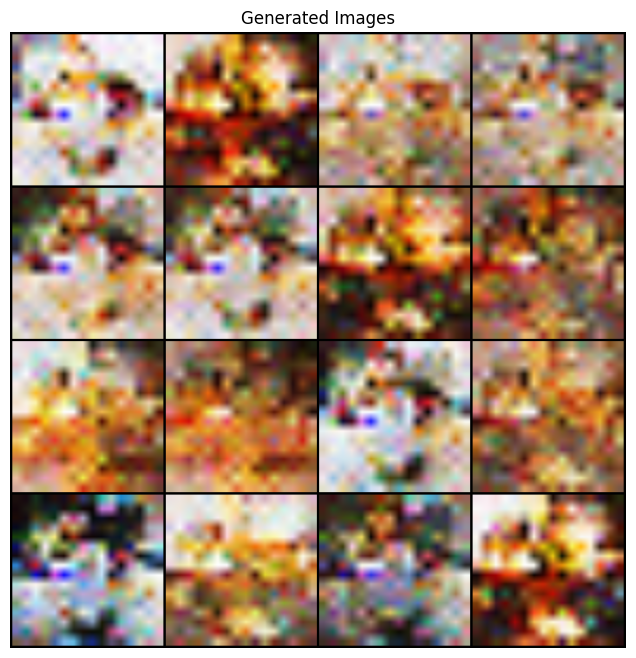

In [95]:
import torch.nn.functional as F

# Example usage
latent_dim = 100  # Set this to match your generator's latent dimension
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
visualize_generated_images(generator1, latent_dim, num_images=16, device=device)

In [96]:
torch.save(generator1.state_dict(), "saved_models/generator_tuning1_epoch_75.pth")
torch.save(discriminator1.state_dict(), "saved_models/discriminator_tuning1_epoch_75.pth")


In [97]:
from torchvision.transforms.functional import resize

# Updated Preprocessing Function for FID
def preprocess_for_fid(images):
    images_resized = torch.stack([resize(img, (299, 299)) for img in images])
    images_normalized = images_resized.clamp(0, 1)  # Ensure range [0, 1]
    return images_normalized

# Updated Preprocessing Function for Inception
def preprocess_for_inception(images):
    images_resized = torch.stack([resize(img, (299, 299)) for img in images])
    images_normalized = (images_resized * 2) - 1  # Normalize to [-1, 1]
    return images_normalized


In [98]:
from torchvision.models import Inception_V3_Weights

inception_model = inception_v3(weights=Inception_V3_Weights.IMAGENET1K_V1, transform_input=False).to(device)


In [99]:
# Save FID and IS results
fid_score = compute_fid(generator1, dataloader, latent_dim, device, num_samples=num_samples)
print(f"FID Score: {fid_score:.4f}")
with open("metrics.txt", "a") as f:
    f.write(f"FID Score for Tuning 1: {fid_score:.4f}\n")

inception_score, inception_std = compute_inception_score(generator1, latent_dim, device, num_samples=num_samples)
print(f"Inception Score: {inception_score:.4f} ± {inception_std:.4f}")
with open("metrics.txt", "a") as f:
    f.write(f"Inception Score for Tuning 1: {inception_score:.4f} ± {inception_std:.4f}\n")


FID Score: 440.4061


Generating Images for IS: 100%|██████████| 15/15 [00:02<00:00,  6.12it/s]

Inception Score: 1.4904 ± 0.0400


### Tuning 2

1. Increase sample size from 7000 to 10,000
2. For discriminator change batch normalization to instance normalization
3. Ran for 50 epochs

In [106]:
# Define YelpDataset
class YelpDataset(Dataset):
    def __init__(self, image_folder, json_file, label_filter, transform=None, max_samples=None):
        self.image_folder = image_folder
        self.transform = transform
        self.label_filter = label_filter
        self.image_files = []

        with open(json_file, 'r') as f:
            for line in f:
                try:
                    entry = json.loads(line.strip())
                    if entry.get('label') == self.label_filter:
                        image_filename = entry['photo_id'] + '.jpg'
                        image_path = os.path.join(image_folder, image_filename)
                        if os.path.isfile(image_path):
                            try:
                                with Image.open(image_path) as img:
                                    img.verify()
                                self.image_files.append(image_filename)
                            except Exception as e:
                                continue
                                # print(f"Skipping corrupted image {image_filename}: {str(e)}")
                except json.JSONDecodeError as e:
                    print(f"Error decoding JSON line: {line.strip()} -> {str(e)}")

        # Sample a subset of data if max_samples is specified
        if max_samples and len(self.image_files) > max_samples:
            self.image_files = random.sample(self.image_files, max_samples)

        print(f"Loaded {len(self.image_files)} valid images with label '{self.label_filter}'")

    def __len__(self):
        return len(self.image_files)
    
    def __getitem__(self, idx):
        while True:
            try:
                img_path = os.path.join(self.image_folder, self.image_files[idx])
                image = Image.open(img_path).convert('RGB')
                if self.transform:
                    image = self.transform(image)
                return image
            except Exception as e:
                print(f"Error loading image {self.image_files[idx]}: {str(e)}")
                idx = (idx + 1) % len(self.image_files)

In [107]:
# Hyperparameters
image_folder = photos
json_file = metadata
label_filter = "food"
transform = transforms.Compose([
    transforms.Resize((64, 64)),
    transforms.ToTensor(),
    transforms.Normalize([0.5], [0.5]),
])

max_samples = 10000

In [108]:
# Initialize Dataset with Sampling
dataset = YelpDataset(image_folder, json_file, label_filter, transform, max_samples=max_samples)

# Create DataLoader
batch_size = 64
dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True)

Loaded 10000 valid images with label 'food'


In [109]:
# Define Generator
class Generator(nn.Module):
    def __init__(self, latent_dim):
        super(Generator, self).__init__()
        self.model = nn.Sequential(
            nn.ConvTranspose2d(latent_dim, 512, kernel_size=4, stride=1, padding=0),
            nn.BatchNorm2d(512),
            nn.ReLU(inplace=True),

            nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),

            nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),

            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),

            nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1),
            nn.Tanh()
        )
        
    def forward(self, z):
        img = self.model(z)
        return img

In [110]:
# Define Discriminator
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.model = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1),
            nn.InstanceNorm2d(128, affine=True),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1),
            nn.InstanceNorm2d(256, affine=True),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(256, 1, kernel_size=4, stride=1, padding=0),
        )

    def forward(self, img):
        validity = self.model(img)
        return validity.view(-1)

In [111]:
# Instantiate Models
latent_dim = 100
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
generator2 = Generator(latent_dim).to(device)
discriminator2 = Discriminator().to(device)

In [112]:
# Gradient Penalty
def compute_gradient_penalty(discriminator, real_samples, fake_samples, device):
    alpha = torch.rand(real_samples.size(0), 1, 1, 1, device=device)
    interpolates = (alpha * real_samples + (1 - alpha) * fake_samples).requires_grad_(True)
    d_interpolates = discriminator(interpolates)
    gradients = torch.autograd.grad(
        outputs=d_interpolates,
        inputs=interpolates,
        grad_outputs=torch.ones_like(d_interpolates, device=device),
        create_graph=True,
        retain_graph=True,
        only_inputs=True
    )[0]
    gradients = gradients.view(gradients.size(0), -1)
    return ((gradients.norm(2, dim=1) - 1) ** 2).mean()

In [113]:
# Loss Functions
def discriminator_loss(discriminator, real_images, fake_images, lambda_gp, device):
    real_validity = discriminator(real_images)
    fake_validity = discriminator(fake_images.detach())
    gradient_penalty = compute_gradient_penalty(discriminator, real_images, fake_images, device)
    return -torch.mean(real_validity) + torch.mean(fake_validity) + lambda_gp * gradient_penalty

def generator_loss(discriminator, fake_images):
    return -torch.mean(discriminator(fake_images))

In [114]:
# Optimizers and Scheduler
lr = 1e-4
beta1, beta2 = 0.0, 0.9
lambda_gp = 10
n_epochs = 50
g_optimizer = torch.optim.Adam(generator2.parameters(), lr=lr, betas=(beta1, beta2))
d_optimizer = torch.optim.Adam(discriminator2.parameters(), lr=lr, betas=(beta1, beta2))

In [115]:
from torchvision.utils import make_grid, save_image
import matplotlib.pyplot as plt

# Function to visualize generated images
def visualize_generated_images(generator, latent_dim, device, epoch, num_images=16):
    """
    Generates and visualizes a grid of images from the generator.
    """
    # Generate random latent vectors
    z = torch.randn(num_images, latent_dim, 1, 1, device=device)
    
    # Generate fake images
    generator.eval()
    with torch.no_grad():
        fake_images = generator(z)
    generator.train()
    
    # Rescale images from [-1, 1] to [0, 1]
    fake_images = (fake_images + 1) / 2

    # Create a grid of images for visualization
    grid_img = make_grid(fake_images, nrow=4, normalize=True)

    # Save the grid of images
    save_image(grid_img, f"generated_images_epoch_{epoch}.png")

    # Display the grid of images using matplotlib
    plt.figure(figsize=(8, 8))
    plt.axis("off")
    plt.title(f"Generated Images at Epoch {epoch}")
    plt.imshow(grid_img.permute(1, 2, 0).cpu().numpy())
    plt.show()


[Epoch 1/50] Loss_D: -0.3668 Loss_G: 1.0768
[Epoch 2/50] Loss_D: -0.5315 Loss_G: 0.5442
[Epoch 3/50] Loss_D: -0.1372 Loss_G: 0.4873
[Epoch 4/50] Loss_D: -0.2168 Loss_G: 0.6487
[Epoch 5/50] Loss_D: -0.1116 Loss_G: 0.7189
[Epoch 6/50] Loss_D: -0.1063 Loss_G: 0.7566
[Epoch 7/50] Loss_D: -0.1963 Loss_G: 0.7037
[Epoch 8/50] Loss_D: -0.1195 Loss_G: 0.6998
[Epoch 9/50] Loss_D: -0.1872 Loss_G: 0.7603
[Epoch 10/50] Loss_D: -0.1774 Loss_G: 0.7852


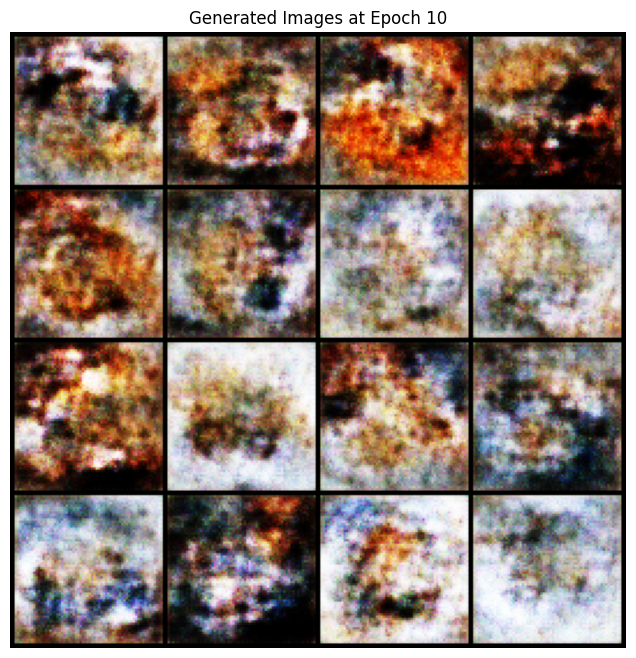

[Epoch 11/50] Loss_D: -0.1587 Loss_G: 0.7650
[Epoch 12/50] Loss_D: -0.0782 Loss_G: 0.8539
[Epoch 13/50] Loss_D: -0.1475 Loss_G: 0.7684
[Epoch 14/50] Loss_D: -0.0709 Loss_G: 0.7348
[Epoch 15/50] Loss_D: -0.1389 Loss_G: 0.8287
[Epoch 16/50] Loss_D: -0.1404 Loss_G: 0.9047
[Epoch 17/50] Loss_D: -0.1582 Loss_G: 0.8682
[Epoch 18/50] Loss_D: -0.1554 Loss_G: 0.8373
[Epoch 19/50] Loss_D: -0.1479 Loss_G: 0.8974
[Epoch 20/50] Loss_D: -0.2008 Loss_G: 0.8368


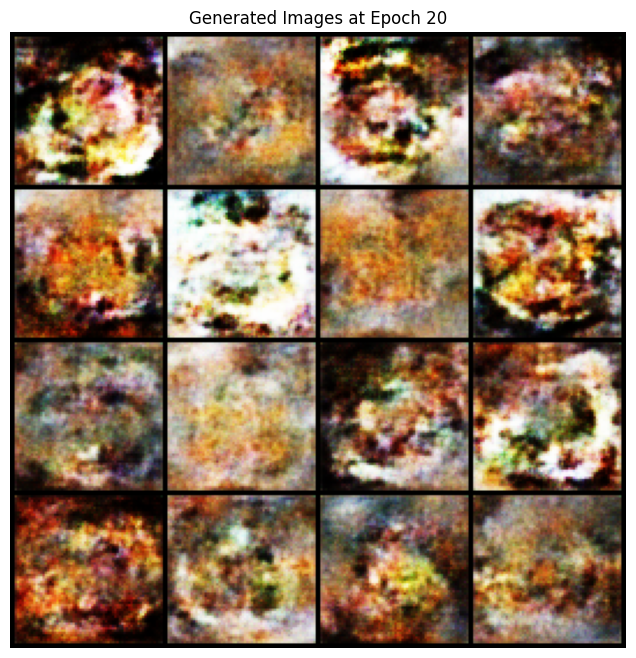

[Epoch 21/50] Loss_D: -0.1612 Loss_G: 0.9359
[Epoch 22/50] Loss_D: -0.1640 Loss_G: 0.9383
[Epoch 23/50] Loss_D: -0.1539 Loss_G: 0.9939
[Epoch 24/50] Loss_D: -0.1393 Loss_G: 1.2309
[Epoch 25/50] Loss_D: -0.1443 Loss_G: 1.1896
[Epoch 26/50] Loss_D: -0.1178 Loss_G: 1.3130
[Epoch 27/50] Loss_D: -0.1590 Loss_G: 1.3013
[Epoch 28/50] Loss_D: -0.1538 Loss_G: 1.2782
[Epoch 29/50] Loss_D: -0.1321 Loss_G: 1.3968
[Epoch 30/50] Loss_D: -0.1210 Loss_G: 1.4284


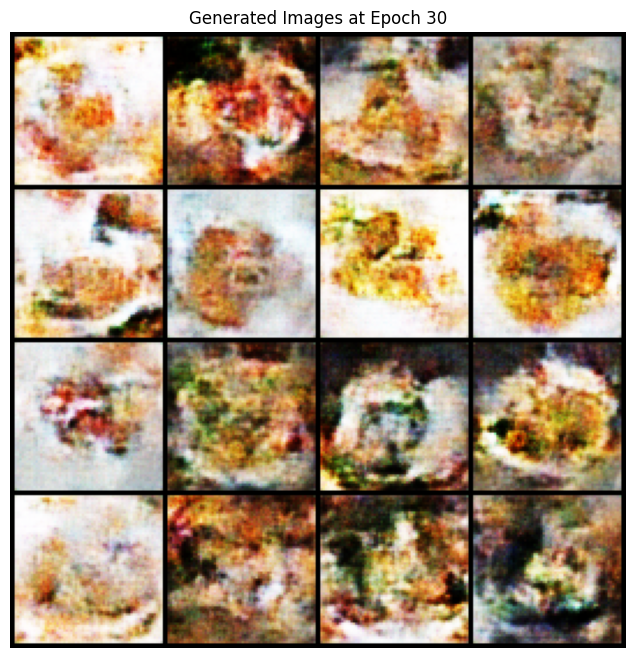

[Epoch 31/50] Loss_D: -0.1534 Loss_G: 1.5205
[Epoch 32/50] Loss_D: -0.1633 Loss_G: 1.5912
[Epoch 33/50] Loss_D: -0.1843 Loss_G: 1.6305
[Epoch 34/50] Loss_D: -0.1791 Loss_G: 1.7444
[Epoch 35/50] Loss_D: -0.1538 Loss_G: 1.6820
[Epoch 36/50] Loss_D: -0.1999 Loss_G: 1.6782
[Epoch 37/50] Loss_D: -0.1793 Loss_G: 1.8080
[Epoch 38/50] Loss_D: -0.1586 Loss_G: 1.8093
[Epoch 39/50] Loss_D: -0.1639 Loss_G: 1.9040
[Epoch 40/50] Loss_D: -0.1758 Loss_G: 1.9619


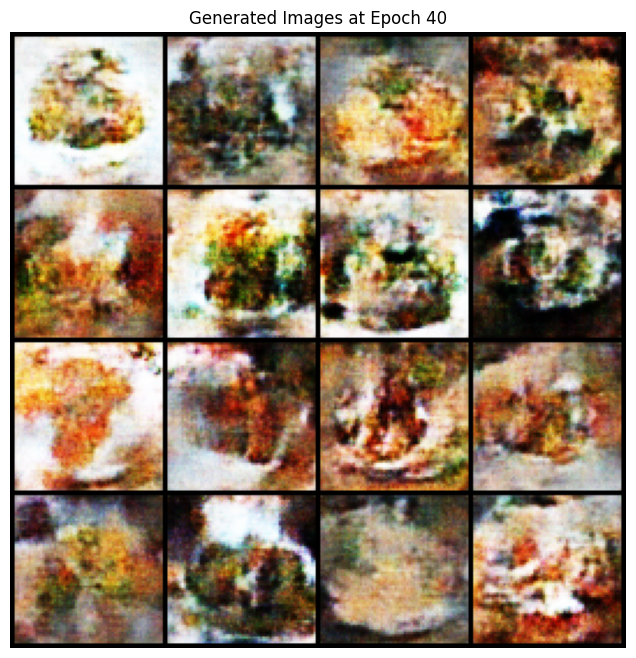

[Epoch 41/50] Loss_D: -0.1960 Loss_G: 1.9848
[Epoch 42/50] Loss_D: -0.1994 Loss_G: 2.0480
[Epoch 43/50] Loss_D: -0.1778 Loss_G: 2.0637
[Epoch 44/50] Loss_D: -0.1758 Loss_G: 2.1901
[Epoch 45/50] Loss_D: -0.1347 Loss_G: 2.1447
[Epoch 46/50] Loss_D: -0.1616 Loss_G: 2.2039
[Epoch 47/50] Loss_D: -0.1242 Loss_G: 2.1846
[Epoch 48/50] Loss_D: -0.1038 Loss_G: 2.3618
[Epoch 49/50] Loss_D: -0.1256 Loss_G: 2.2982
[Epoch 50/50] Loss_D: -0.1191 Loss_G: 2.3631


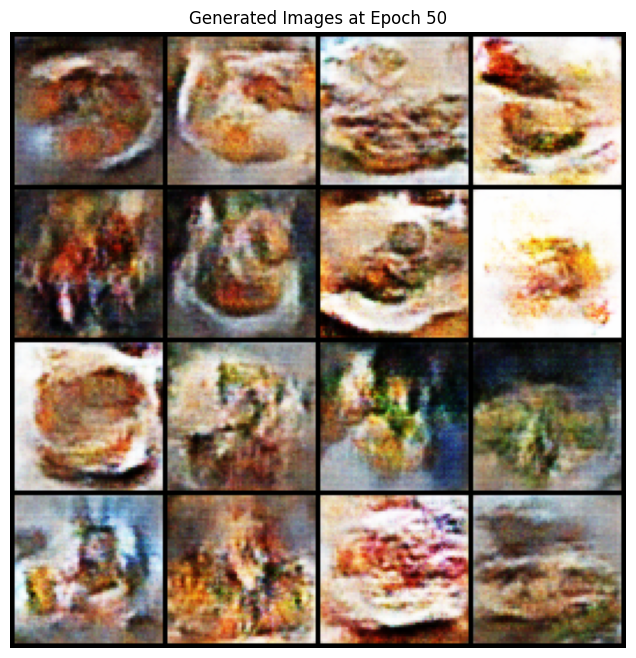

In [116]:
# Updated Training Loop
for epoch in range(n_epochs):
    for i, real_images in enumerate(dataloader):
        real_images = real_images.to(device)

        # Generate fake images
        z = torch.randn(real_images.size(0), latent_dim, 1, 1, device=device)
        fake_images = generator2(z)

        # Update Discriminator
        d_optimizer.zero_grad()
        loss_D = discriminator_loss(discriminator2, real_images, fake_images, lambda_gp, device)
        loss_D.backward()
        d_optimizer.step()

        # Update Generator
        if i % 5 == 0:  # Update generator less frequently
            g_optimizer.zero_grad()
            z = torch.randn(batch_size, latent_dim, 1, 1, device=device)
            fake_images = generator2(z)
            loss_G = generator_loss(discriminator2, fake_images)
            loss_G.backward()
            g_optimizer.step()
    
    # Step learning rate scheduler
    scheduler_g.step()
    scheduler_d.step()

    # Print losses
    print(f"[Epoch {epoch + 1}/{n_epochs}] Loss_D: {loss_D.item():.4f} Loss_G: {loss_G.item():.4f}")

    # Visualize generated images every 10 epochs
    if (epoch + 1) % 10 == 0:
        visualize_generated_images(generator2, latent_dim, device, epoch + 1)

In [117]:
import torch
from torch.nn.functional import softmax
from torchvision.models import inception_v3
from torchvision.transforms import functional as F
from torch.utils.data import DataLoader
from torchvision.utils import save_image
from tqdm import tqdm
from torcheval.metrics import FrechetInceptionDistance
import numpy as np


In [118]:
torch.save(generator2.state_dict(), "saved_models/generator_tuning2_epoch_50.pth")
torch.save(discriminator2.state_dict(), "saved_models/discriminator_tuning2_epoch_50.pth")


In [119]:
# Function to preprocess images for FID and IS
def preprocess_images(images, size=(299, 299), normalize=False):
    """
    Preprocess images for metrics evaluation (FID/IS).
    """
    images_resized = torch.stack([F.resize(img, size) for img in images])
    if normalize:
        images_resized = (images_resized - 0.5) / 0.5  # Normalize to [-1, 1] for IS
    else:
        images_resized = images_resized.clamp(0, 1)  # Ensure values are in [0, 1] for FID
    return images_resized

# Function to compute FID
def compute_fid(generator, dataloader, latent_dim, device, num_samples=5000, batch_size=64):
    """
    Computes the Fréchet Inception Distance (FID) using Torcheval.
    """
    generator.eval()
    fid_metric = FrechetInceptionDistance().to(device)

    # Add real images to FID metric
    for real_imgs in dataloader:
        real_imgs = real_imgs.to(device)
        real_imgs_preprocessed = preprocess_images(real_imgs, size=(299, 299))
        fid_metric.update(real_imgs_preprocessed, is_real=True)

    # Generate fake images and add to FID metric
    with torch.no_grad():
        for _ in range(num_samples // batch_size):
            z = torch.randn(batch_size, latent_dim, 1, 1, device=device)
            gen_imgs = generator(z)
            gen_imgs = (gen_imgs + 1) / 2  # Rescale [-1, 1] to [0, 1]
            gen_imgs_preprocessed = preprocess_images(gen_imgs, size=(299, 299))
            fid_metric.update(gen_imgs_preprocessed, is_real=False)

    fid_score = fid_metric.compute()
    fid_metric.reset()
    generator.train()

    return fid_score.item()

In [120]:
# Function to compute Inception Score (IS)
def compute_inception_score(generator, latent_dim, device, num_samples=5000, batch_size=64, splits=10):
    """
    Computes the Inception Score (IS) for generated images.
    """
    generator.eval()
    inception_model = inception_v3(pretrained=True, transform_input=False).to(device)
    inception_model.eval()

    preds = []
    with torch.no_grad():
        for _ in tqdm(range(num_samples // batch_size), desc="Generating Images for IS"):
            # Generate fake images
            z = torch.randn(batch_size, latent_dim, 1, 1, device=device)
            gen_imgs = generator(z)
            gen_imgs = (gen_imgs + 1) / 2  # Rescale [-1, 1] to [0, 1]

            # Preprocess images for InceptionV3
            gen_imgs_preprocessed = F.resize(gen_imgs, (299, 299)).to(device)

            # Get predictions from InceptionV3
            logits = inception_model(gen_imgs_preprocessed)
            preds.append(softmax(logits, dim=1).cpu().numpy())

    preds = np.concatenate(preds, axis=0)

    # Compute IS
    split_scores = []
    for i in range(splits):
        part = preds[i * (num_samples // splits): (i + 1) * (num_samples // splits), :]
        py = np.mean(part, axis=0)
        scores = part * (np.log(part) - np.log(py))
        split_scores.append(np.exp(np.mean(np.sum(scores, axis=1))))

    inception_score = np.mean(split_scores)
    std = np.std(split_scores)

    generator.train()
    return inception_score, std


In [121]:
# Evaluation and Model Saving
latent_dim = 100
num_samples = 1000
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Evaluate FID
print("Calculating Fréchet Inception Distance...")
fid_score = compute_fid(generator2, dataloader, latent_dim, device, num_samples=num_samples)
print(f"FID Score: {fid_score:.4f}")

# Evaluate Inception Score
print("Calculating Inception Score...")
inception_score, inception_std = compute_inception_score(generator2, latent_dim, device, num_samples=num_samples)
print(f"Inception Score: {inception_score:.4f} ± {inception_std:.4f}")

Calculating Fréchet Inception Distance...
FID Score: 165.2418
Calculating Inception Score...


c:\Users\arshi\anaconda3\envs\yelp_image_models\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\arshi\anaconda3\envs\yelp_image_models\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=Inception_V3_Weights.IMAGENET1K_V1`. You can also use `weights=Inception_V3_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Generating Images for IS: 100%|██████████| 15/15 [00:02<00:00,  6.38it/s]

Inception Score: 1.9398 ± 0.1045


In [122]:
# Save FID and IS results
fid_score = compute_fid(generator2, dataloader, latent_dim, device, num_samples=num_samples)
print(f"FID Score: {fid_score:.4f}")
with open("metrics.txt", "a") as f:
    f.write(f"FID Score for Tuning 2: {fid_score:.4f}\n")

inception_score, inception_std = compute_inception_score(generator2, latent_dim, device, num_samples=num_samples)
print(f"Inception Score: {inception_score:.4f} ± {inception_std:.4f}")
with open("metrics.txt", "a") as f:
    f.write(f"Inception Score for Tuning 2: {inception_score:.4f} ± {inception_std:.4f}\n")


FID Score: 167.5063


Generating Images for IS: 100%|██████████| 15/15 [00:02<00:00,  6.27it/s]

Inception Score: 1.9839 ± 0.0896


In [ ]:
# # Save models
# def save_models(generator, discriminator, epoch, path="models"):
#     """
#     Save the generator and discriminator models.
#     """
#     os.makedirs(path, exist_ok=True)
#     torch.save(generator.state_dict(), f"{path}/generator_epoch_{epoch}.pth")
#     torch.save(discriminator.state_dict(), f"{path}/discriminator_epoch_{epoch}.pth")
#     print(f"Models saved for epoch {epoch}.")

In [ ]:
# save_models(generator, discriminator, epoch=n_epochs, path="saved_models")

Models saved for epoch 50.


### Tuning 3

1. increase sample image size from 10,000 to 12,0000
2. number of epochs is 100
3. changed learning rate to 5 * 10^-5

In [123]:
image_folder = photos
json_file = metadata
label_filter = "food"
transform = transforms.Compose([
    transforms.Resize((64, 64)),
    transforms.ToTensor(),
    transforms.Normalize([0.5], [0.5]),
])

max_samples = 12000

In [124]:
# Initialize Dataset with Sampling
dataset = YelpDataset(image_folder, json_file, label_filter, transform, max_samples=max_samples)

# Create DataLoader
batch_size = 64
dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True)

Loaded 12000 valid images with label 'food'


In [125]:
class Generator(nn.Module):
    def __init__(self, latent_dim):
        super(Generator, self).__init__()
        
        self.model = nn.Sequential(
            nn.ConvTranspose2d(latent_dim, 512, kernel_size=4, stride=1, padding=0),  # Output: (batch_size, 512, 4, 4)
            nn.BatchNorm2d(512),
            nn.ReLU(inplace=True),
            
            nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1),  # Output: (batch_size, 256, 8, 8)
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),
            
            nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1),  # Output: (batch_size, 128, 16, 16)
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
            
            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1),  # Output: (batch_size, 64, 32, 32)
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            
            nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1),  # Output: (batch_size, 3, 64, 64)
            nn.Tanh()  # Rescale to [-1, 1]
        )
        
    def forward(self, z):
        img = self.model(z)
        return img


In [126]:
# Define Discriminator
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.model = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1),
            nn.InstanceNorm2d(128, affine=True),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1),
            nn.InstanceNorm2d(256, affine=True),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(256, 1, kernel_size=4, stride=1, padding=0),
        )

    def forward(self, img):
        validity = self.model(img)
        return validity.view(-1)

In [127]:
latent_dim = 100
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Instantiate models
generator3 = Generator(latent_dim).to(device)
discriminator3 = Discriminator().to(device)

In [128]:
def compute_gradient_penalty(discriminator, real_samples, fake_samples, device):
    alpha = torch.rand(real_samples.size(0), 1, 1, 1, device=device)
    interpolates = (alpha * real_samples + (1 - alpha) * fake_samples).requires_grad_(True)
    
    d_interpolates = discriminator(interpolates)
    gradients = torch.autograd.grad(
        outputs=d_interpolates,
        inputs=interpolates,
        grad_outputs=torch.ones_like(d_interpolates, device=device),
        create_graph=True,
        retain_graph=True,
        only_inputs=True
    )[0]
    
    gradients = gradients.view(gradients.size(0), -1)
    gradient_penalty = ((gradients.norm(2, dim=1) - 1) ** 2).mean()
    return gradient_penalty


In [129]:
def discriminator_loss(discriminator, real_images, fake_images, lambda_gp, device):
    """
    Calculates the discriminator loss with gradient penalty.
    """
    real_validity = discriminator(real_images)
    fake_validity = discriminator(fake_images.detach())
    gradient_penalty = compute_gradient_penalty(discriminator, real_images, fake_images, device)
    d_loss = -torch.mean(real_validity) + torch.mean(fake_validity) + lambda_gp * gradient_penalty
    return d_loss


def generator_loss(discriminator, fake_images):
    """
    Calculates the generator loss.
    """
    g_loss = -torch.mean(discriminator(fake_images))
    return g_loss


In [130]:
# Hyperparameters

batch_size = 64
lr = 5e-5
beta1, beta2 = 0.0, 0.9
lambda_gp = 10
n_epochs = 100


# Optimizers
g_optimizer = torch.optim.Adam(generator3.parameters(), lr=lr, betas=(beta1, beta2))
d_optimizer = torch.optim.Adam(discriminator3.parameters(), lr=lr, betas=(beta1, beta2))

# Scheduler
scheduler_g = torch.optim.lr_scheduler.StepLR(g_optimizer, step_size=20, gamma=0.5)
scheduler_d = torch.optim.lr_scheduler.StepLR(d_optimizer, step_size=20, gamma=0.5)


In [131]:
from torchvision.utils import make_grid, save_image
import matplotlib.pyplot as plt

# Function to visualize generated images
def visualize_generated_images(generator, latent_dim, device, epoch, num_images=16):
    """
    Generates and visualizes a grid of images from the generator.
    """
    # Generate random latent vectors
    z = torch.randn(num_images, latent_dim, 1, 1, device=device)
    
    # Generate fake images
    generator.eval()
    with torch.no_grad():
        fake_images = generator(z)
    generator.train()
    
    # Rescale images from [-1, 1] to [0, 1]
    fake_images = (fake_images + 1) / 2

    # Create a grid of images for visualization
    grid_img = make_grid(fake_images, nrow=4, normalize=True)

    # Save the grid of images
    save_image(grid_img, f"generated_images_epoch_{epoch}.png")

    # Display the grid of images using matplotlib
    plt.figure(figsize=(8, 8))
    plt.axis("off")
    plt.title(f"Generated Images at Epoch {epoch}")
    plt.imshow(grid_img.permute(1, 2, 0).cpu().numpy())
    plt.show()


[Epoch 1/100] Loss_D: -0.3082 Loss_G: 0.6933
[Epoch 2/100] Loss_D: -0.5888 Loss_G: 0.6604
[Epoch 3/100] Loss_D: -0.4798 Loss_G: 0.4258
[Epoch 4/100] Loss_D: -0.3437 Loss_G: 0.5465
[Epoch 5/100] Loss_D: -0.3151 Loss_G: 0.7104
[Epoch 6/100] Loss_D: -0.3191 Loss_G: 0.7418
[Epoch 7/100] Loss_D: -0.3154 Loss_G: 0.6861
[Epoch 8/100] Loss_D: -0.3506 Loss_G: 0.7213
[Epoch 9/100] Loss_D: -0.3431 Loss_G: 0.7560
[Epoch 10/100] Loss_D: -0.3315 Loss_G: 0.8270
[Epoch 11/100] Loss_D: -0.3366 Loss_G: 0.8294
[Epoch 12/100] Loss_D: -0.2779 Loss_G: 0.9214
[Epoch 13/100] Loss_D: -0.2988 Loss_G: 0.9424
[Epoch 14/100] Loss_D: -0.2832 Loss_G: 0.9768
[Epoch 15/100] Loss_D: -0.2897 Loss_G: 1.0790
[Epoch 16/100] Loss_D: -0.2570 Loss_G: 1.1527
[Epoch 17/100] Loss_D: -0.2238 Loss_G: 1.1891
[Epoch 18/100] Loss_D: -0.2492 Loss_G: 1.2817
[Epoch 19/100] Loss_D: -0.2375 Loss_G: 1.3373
[Epoch 20/100] Loss_D: -0.2471 Loss_G: 1.3726


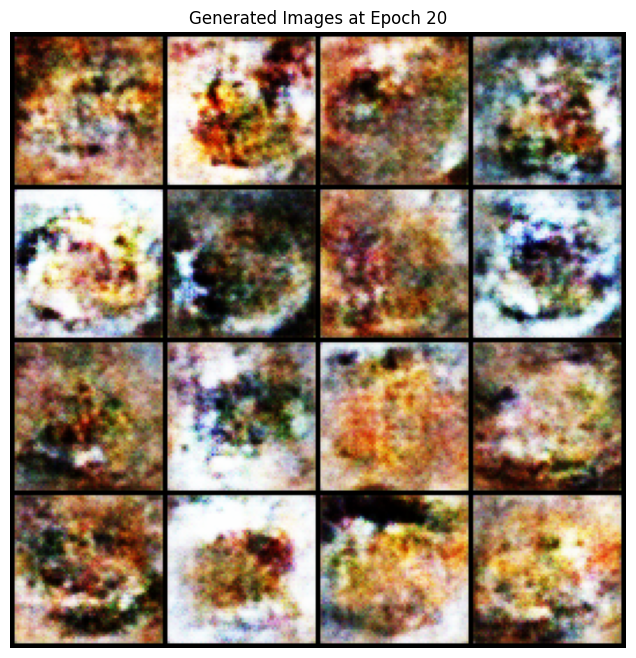

[Epoch 21/100] Loss_D: -0.2523 Loss_G: 1.3285
[Epoch 22/100] Loss_D: -0.2617 Loss_G: 1.3761
[Epoch 23/100] Loss_D: -0.2680 Loss_G: 1.3950
[Epoch 24/100] Loss_D: -0.2553 Loss_G: 1.4218
[Epoch 25/100] Loss_D: -0.2333 Loss_G: 1.4513
[Epoch 26/100] Loss_D: -0.2746 Loss_G: 1.4773
[Epoch 27/100] Loss_D: -0.2421 Loss_G: 1.5226
[Epoch 28/100] Loss_D: -0.2583 Loss_G: 1.4949
[Epoch 29/100] Loss_D: -0.2449 Loss_G: 1.5319
[Epoch 30/100] Loss_D: -0.2432 Loss_G: 1.5397
[Epoch 31/100] Loss_D: -0.2331 Loss_G: 1.6133
[Epoch 32/100] Loss_D: -0.2464 Loss_G: 1.6489
[Epoch 33/100] Loss_D: -0.2355 Loss_G: 1.6868
[Epoch 34/100] Loss_D: -0.2518 Loss_G: 1.7211
[Epoch 35/100] Loss_D: -0.2608 Loss_G: 1.7837
[Epoch 36/100] Loss_D: -0.2679 Loss_G: 1.7907
[Epoch 37/100] Loss_D: -0.2677 Loss_G: 1.8657
[Epoch 38/100] Loss_D: -0.2773 Loss_G: 1.8951
[Epoch 39/100] Loss_D: -0.2290 Loss_G: 1.8834
[Epoch 40/100] Loss_D: -0.2847 Loss_G: 1.9792


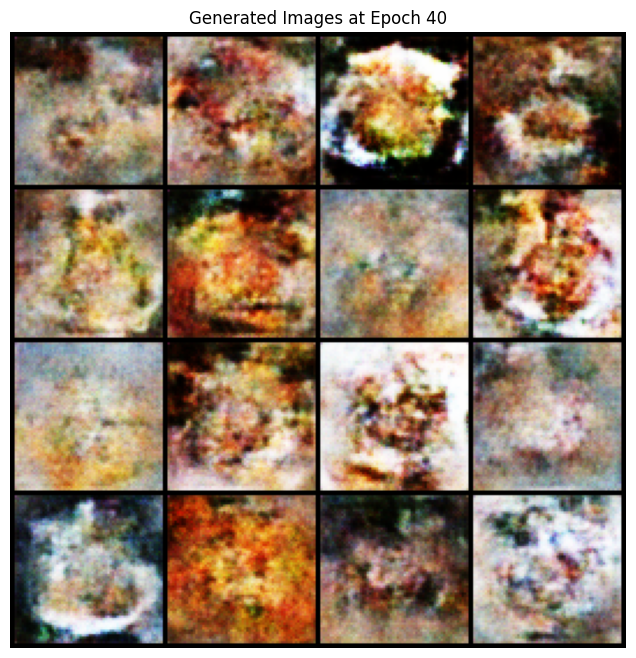

[Epoch 41/100] Loss_D: -0.2757 Loss_G: 2.0161
[Epoch 42/100] Loss_D: -0.2640 Loss_G: 2.0323
[Epoch 43/100] Loss_D: -0.2750 Loss_G: 2.0549
[Epoch 44/100] Loss_D: -0.2611 Loss_G: 2.0848
[Epoch 45/100] Loss_D: -0.2515 Loss_G: 2.0748
[Epoch 46/100] Loss_D: -0.2441 Loss_G: 2.0977
[Epoch 47/100] Loss_D: -0.3256 Loss_G: 2.1362
[Epoch 48/100] Loss_D: -0.2806 Loss_G: 2.1260
[Epoch 49/100] Loss_D: -0.2631 Loss_G: 2.1662
[Epoch 50/100] Loss_D: -0.2582 Loss_G: 2.1734
[Epoch 51/100] Loss_D: -0.2714 Loss_G: 2.2076
[Epoch 52/100] Loss_D: -0.2491 Loss_G: 2.2239
[Epoch 53/100] Loss_D: -0.2685 Loss_G: 2.2401
[Epoch 54/100] Loss_D: -0.2686 Loss_G: 2.2768
[Epoch 55/100] Loss_D: -0.2699 Loss_G: 2.2958
[Epoch 56/100] Loss_D: -0.2734 Loss_G: 2.3159
[Epoch 57/100] Loss_D: -0.2610 Loss_G: 2.3467
[Epoch 58/100] Loss_D: -0.2777 Loss_G: 2.3444
[Epoch 59/100] Loss_D: -0.2939 Loss_G: 2.3664
[Epoch 60/100] Loss_D: -0.2758 Loss_G: 2.3850


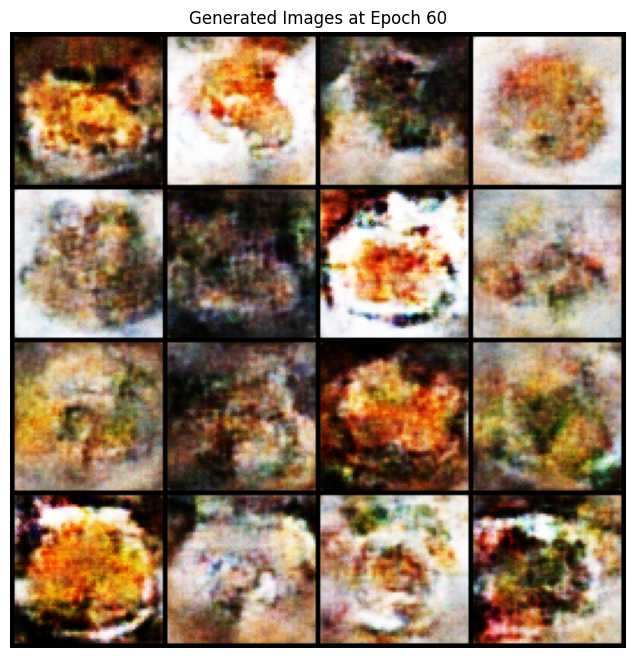

[Epoch 61/100] Loss_D: -0.2807 Loss_G: 2.3906
[Epoch 62/100] Loss_D: -0.2888 Loss_G: 2.3726
[Epoch 63/100] Loss_D: -0.2667 Loss_G: 2.4027
[Epoch 64/100] Loss_D: -0.3068 Loss_G: 2.4170
[Epoch 65/100] Loss_D: -0.2781 Loss_G: 2.4116
[Epoch 66/100] Loss_D: -0.2922 Loss_G: 2.4165
[Epoch 67/100] Loss_D: -0.2709 Loss_G: 2.4361
[Epoch 68/100] Loss_D: -0.2952 Loss_G: 2.4196
[Epoch 69/100] Loss_D: -0.2826 Loss_G: 2.4118
[Epoch 70/100] Loss_D: -0.2435 Loss_G: 2.4578
[Epoch 71/100] Loss_D: -0.2888 Loss_G: 2.4436
[Epoch 72/100] Loss_D: -0.3024 Loss_G: 2.4578
[Epoch 73/100] Loss_D: -0.3098 Loss_G: 2.4617
[Epoch 74/100] Loss_D: -0.2892 Loss_G: 2.4730
[Epoch 75/100] Loss_D: -0.2865 Loss_G: 2.4653
[Epoch 76/100] Loss_D: -0.2858 Loss_G: 2.4886
[Epoch 77/100] Loss_D: -0.2812 Loss_G: 2.4936
[Epoch 78/100] Loss_D: -0.2679 Loss_G: 2.5002
[Epoch 79/100] Loss_D: -0.2414 Loss_G: 2.5026
[Epoch 80/100] Loss_D: -0.2778 Loss_G: 2.5127


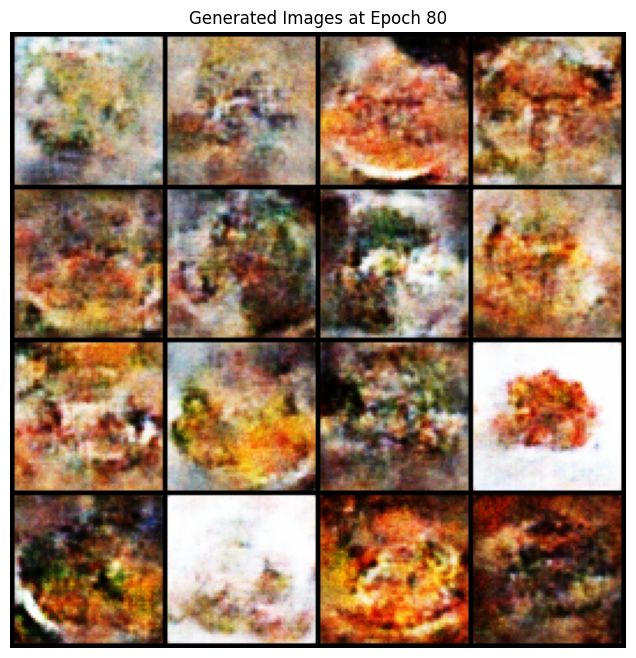

[Epoch 81/100] Loss_D: -0.2698 Loss_G: 2.5229
[Epoch 82/100] Loss_D: -0.2742 Loss_G: 2.5138
[Epoch 83/100] Loss_D: -0.2669 Loss_G: 2.5283
[Epoch 84/100] Loss_D: -0.2470 Loss_G: 2.5269
[Epoch 85/100] Loss_D: -0.2755 Loss_G: 2.5248
[Epoch 86/100] Loss_D: -0.2759 Loss_G: 2.5030
[Epoch 87/100] Loss_D: -0.2889 Loss_G: 2.5208
[Epoch 88/100] Loss_D: -0.2379 Loss_G: 2.5388
[Epoch 89/100] Loss_D: -0.2526 Loss_G: 2.5326
[Epoch 90/100] Loss_D: -0.2853 Loss_G: 2.5288
[Epoch 91/100] Loss_D: -0.3095 Loss_G: 2.5370
[Epoch 92/100] Loss_D: -0.3185 Loss_G: 2.5423
[Epoch 93/100] Loss_D: -0.3095 Loss_G: 2.5448
[Epoch 94/100] Loss_D: -0.2937 Loss_G: 2.5566
[Epoch 95/100] Loss_D: -0.2854 Loss_G: 2.5482
[Epoch 96/100] Loss_D: -0.2741 Loss_G: 2.5475
[Epoch 97/100] Loss_D: -0.2784 Loss_G: 2.5500
[Epoch 98/100] Loss_D: -0.3026 Loss_G: 2.5676
[Epoch 99/100] Loss_D: -0.3005 Loss_G: 2.5424
[Epoch 100/100] Loss_D: -0.2518 Loss_G: 2.5461


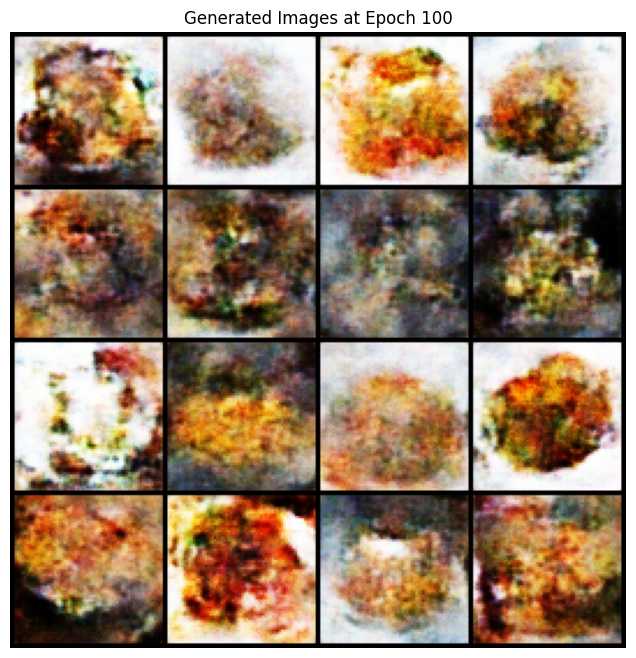

In [132]:
# Training Loop
from tqdm import tqdm

for epoch in range(n_epochs):
    for i, real_images in enumerate(dataloader):
        real_images = real_images.to(device)

        # Generate fake images
        z = torch.randn(real_images.size(0), latent_dim, 1, 1, device=device)
        fake_images = generator3(z)

        # Update Discriminator
        d_optimizer.zero_grad()
        loss_D = discriminator_loss(discriminator3, real_images, fake_images, lambda_gp, device)
        loss_D.backward()
        d_optimizer.step()

        # Update Generator
        if i % 5 == 0:  # Update generator less frequently
            g_optimizer.zero_grad()
            z = torch.randn(batch_size, latent_dim, 1, 1, device=device)
            fake_images = generator3(z)
            loss_G = generator_loss(discriminator3, fake_images)
            loss_G.backward()
            g_optimizer.step()

    # Step learning rate scheduler
    scheduler_g.step()
    scheduler_d.step()

    # Print losses
    print(f"[Epoch {epoch + 1}/{n_epochs}] Loss_D: {loss_D.item():.4f} Loss_G: {loss_G.item():.4f}")

    # Visualize generated images every 10 epochs
    if (epoch + 1) % 20 == 0:
        visualize_generated_images(generator3, latent_dim, device, epoch + 1)


In [137]:
# Evaluation and Model Saving
latent_dim = 100
num_samples = 1000
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Evaluate FID
print("Calculating Fréchet Inception Distance...")
fid_score = compute_fid(generator3, dataloader, latent_dim, device, num_samples=num_samples)
print(f"FID Score: {fid_score:.4f}")

# Evaluate Inception Score
print("Calculating Inception Score...")
inception_score, inception_std = compute_inception_score(generator3, latent_dim, device, num_samples=num_samples)
print(f"Inception Score: {inception_score:.4f} ± {inception_std:.4f}")

Calculating Fréchet Inception Distance...
FID Score: 198.4964
Calculating Inception Score...


Generating Images for IS: 100%|██████████| 15/15 [00:02<00:00,  6.39it/s]

Inception Score: 1.6336 ± 0.0458


In [138]:
# Save FID and IS results
fid_score = compute_fid(generator3, dataloader, latent_dim, device, num_samples=num_samples)
print(f"FID Score: {fid_score:.4f}")
with open("metrics.txt", "a") as f:
    f.write(f"FID Score for Tuning 3: {fid_score:.4f}\n")

inception_score, inception_std = compute_inception_score(generator3, latent_dim, device, num_samples=num_samples)
print(f"Inception Score: {inception_score:.4f} ± {inception_std:.4f}")
with open("metrics.txt", "a") as f:
    f.write(f"Inception Score for Tuning 3: {inception_score:.4f} ± {inception_std:.4f}\n")


FID Score: 197.6044


Generating Images for IS: 100%|██████████| 15/15 [00:02<00:00,  6.36it/s]

Inception Score: 1.6335 ± 0.0524


In [139]:
torch.save(generator3.state_dict(), "saved_models/generator_tuning3_epoch_100.pth")
torch.save(discriminator3.state_dict(), "saved_models/discriminator_tuning3_epoch_100.pth")


In [ ]:
# # Save models
# def save_models(generator, discriminator, epoch, path="models"):
#     """
#     Save the generator and discriminator models.
#     """
#     os.makedirs(path, exist_ok=True)
#     torch.save(generator.state_dict(), f"{path}/generator_epoch_{epoch}.pth")
#     torch.save(discriminator.state_dict(), f"{path}/discriminator_epoch_{epoch}.pth")
#     print(f"Models saved for epoch {epoch}.")

In [1]:
# save_models(generator, discriminator, epoch=n_epochs, path="saved_models")